In [ ]:
%pip install xformers

In [ ]:
%pip install matplotlib

## Hyper parameters 

In [1]:
######################################################
# Source Model
MODEL_NAME = "stabilityai/stable-diffusion-xl-base-1.0"

######################################################
# DataSet
DEFAULT_PROMPT = "a photo of tiry person" 
CLASS_DIR = "tiry_pics_processed_1024"     
RESOLUTION = 1024

######################################################
## LORA
# Where Lora weights are stored
LORA_DIR = "sdxl-tiry-lora"    
LORA_RANK=16
LORA_ALPHA=32

# TARGET MODULES
LORA_TARGET_MODULES = [
    "to_k", "to_q", "to_v", "to_out.0", # attention layers
#    "proj_in", "proj_out",              # feed forward 
#    "ff.net.0.proj", "ff.net.2", 
#    "time_emb_proj"
]

######################################################
# Training
TRAIN_STEPS = 2000       
BATCH_SIZE = 1           # Limit VRAM usage
ACCUMULATION_STEPS = 4   # Accumulate to compensate for bacth size
LEARNING_RATE = 1e-4

PRECISION="fp16"
PRECISION="bf16"
import torch

FLOAT_TYPE=torch.float16
FLOAT_TYPE=torch.bfloat16

In [2]:
import os
import torch
import itertools
import gc
import bitsandbytes as bnb
from diffusers import AutoencoderKL, DDPMScheduler, UNet2DConditionModel
from transformers import CLIPTextModel, CLIPTokenizer, CLIPTextModelWithProjection
from peft import LoraConfig, get_peft_model
from torchvision import transforms
from PIL import Image
from accelerate import Accelerator

# Memory Optimization
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

accelerator = Accelerator(
    mixed_precision=PRECISION,
    gradient_accumulation_steps=ACCUMULATION_STEPS 
)

# --- PHASE 1: PRE-PROCESSING ---
print("PHASE 1: Encoding Images for SDXL...")

# 1. Load Tokenizers and Encoders (SDXL has TWO of each)
tokenizer_1 = CLIPTokenizer.from_pretrained(MODEL_NAME, subfolder="tokenizer")
tokenizer_2 = CLIPTokenizer.from_pretrained(MODEL_NAME, subfolder="tokenizer_2")

text_encoder_1 = CLIPTextModel.from_pretrained(MODEL_NAME, subfolder="text_encoder", variant="fp16").to(accelerator.device, dtype=FLOAT_TYPE)
text_encoder_2 = CLIPTextModelWithProjection.from_pretrained(MODEL_NAME, subfolder="text_encoder_2", variant="fp16").to(accelerator.device, dtype=FLOAT_TYPE)
vae = AutoencoderKL.from_pretrained(MODEL_NAME, subfolder="vae", variant="fp16").to(accelerator.device, dtype=FLOAT_TYPE)

train_transforms = transforms.Compose([
    transforms.Resize(RESOLUTION, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(RESOLUTION),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

def compute_time_ids(original_size, crops_coords_top_left=(0,0)):
    # SDXL needs to know the original image size to understand cropping
    # Images are already cropped 1024x1024 
    target_size = (RESOLUTION, RESOLUTION)
    add_time_ids = list(original_size + crops_coords_top_left + target_size)
    add_time_ids = torch.tensor([add_time_ids])
    return add_time_ids

cached_data = []
image_files = [f for f in os.listdir(CLASS_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

print(f"Processing {len(image_files)} images...")

for filename in image_files:
    # A. Load Image
    img_path = os.path.join(CLASS_DIR, filename)
    img = Image.open(img_path).convert("RGB")
    original_size = img.size
    
    pixel_values = train_transforms(img).unsqueeze(0).to(accelerator.device, dtype=FLOAT_TYPE)
    
    # B. Load Caption 
    txt_path = os.path.splitext(img_path)[0] + ".txt"
    caption = DEFAULT_PROMPT
    if os.path.exists(txt_path):
        with open(txt_path, "r") as f:
            caption = f.read().strip()

    # C. Encode VAE (Latents)
    with torch.no_grad():
        latents = vae.encode(pixel_values).latent_dist.sample() * vae.config.scaling_factor
        latents = latents.cpu()

    # D. Encode Text 
    with torch.no_grad():
        # Encoder 1
        tokens_1 = tokenizer_1(caption, padding="max_length", max_length=77, truncation=True, return_tensors="pt").input_ids.to(accelerator.device)
        enc_1 = text_encoder_1(tokens_1, output_hidden_states=True)
        
        # Encoder 2
        tokens_2 = tokenizer_2(caption, padding="max_length", max_length=77, truncation=True, return_tensors="pt").input_ids.to(accelerator.device)
        enc_2 = text_encoder_2(tokens_2, output_hidden_states=True)
        
        # Concatenate Hidden States (The main prompt embedding)
        pooled_prompt_embeds = enc_2.text_embeds # This goes into added_cond_kwargs
        prompt_embeds = torch.cat([enc_1.hidden_states[-2], enc_2.hidden_states[-2]], dim=-1) # This goes into standard inputs
        
        # Move to CPU
        prompt_embeds = prompt_embeds.cpu()
        pooled_prompt_embeds = pooled_prompt_embeds.cpu()

    # E. Time IDs (Coordinate embedding)
    time_ids = compute_time_ids(original_size).cpu()

    cached_data.append({
        "latents": latents, 
        "prompt_embeds": prompt_embeds,
        "pooled_prompt_embeds": pooled_prompt_embeds,
        "time_ids": time_ids
    })

# Clean VRAM
del vae, text_encoder_1, text_encoder_2, tokenizer_1, tokenizer_2
torch.cuda.empty_cache()
gc.collect()


# --- PHASE 2: TRAINING ---
print(f"\nPHASE 2: Starting SDXL Training ({TRAIN_STEPS} Steps)...")

# Load SDXL UNet
unet = UNet2DConditionModel.from_pretrained(MODEL_NAME, subfolder="unet", variant="fp16").to(accelerator.device, dtype=FLOAT_TYPE)
noise_scheduler = DDPMScheduler.from_pretrained(MODEL_NAME, subfolder="scheduler")

unet.requires_grad_(False)
unet.enable_gradient_checkpointing()
try:
    unet.enable_xformers_memory_efficient_attention()
except:
    pass

# LoRA Setup
lora_config = LoraConfig(
    r=LORA_RANK,                            
    lora_alpha=LORA_ALPHA,
    target_modules=LORA_TARGET_MODULES,
    init_lora_weights="gaussian",
)
unet = get_peft_model(unet, lora_config)
optimizer = bnb.optim.AdamW8bit(unet.parameters(), lr=LEARNING_RATE)
unet, optimizer = accelerator.prepare(unet, optimizer)

# Custom Dataloader
class CachedDataset(torch.utils.data.Dataset):
    def __init__(self, data): self.data = data
    def __len__(self): return len(self.data)
    def __getitem__(self, idx): return self.data[idx]

def collate_fn(examples):
    latents = torch.cat([ex["latents"] for ex in examples], dim=0)
    prompt_embeds = torch.cat([ex["prompt_embeds"] for ex in examples], dim=0)
    pooled_prompt_embeds = torch.cat([ex["pooled_prompt_embeds"] for ex in examples], dim=0)
    time_ids = torch.cat([ex["time_ids"] for ex in examples], dim=0)
    return {
        "latents": latents, 
        "prompt_embeds": prompt_embeds,
        "pooled_prompt_embeds": pooled_prompt_embeds,
        "time_ids": time_ids
    }

train_dataloader = torch.utils.data.DataLoader(
    CachedDataset(cached_data), 
    batch_size=BATCH_SIZE, 
    shuffle=True, 
    collate_fn=collate_fn
)

unet.train()
data_iter = itertools.cycle(train_dataloader)

for step in range(TRAIN_STEPS):
    batch = next(data_iter)
    
    latents = batch["latents"].to(accelerator.device, dtype=FLOAT_TYPE)
    prompt_embeds = batch["prompt_embeds"].to(accelerator.device, dtype=FLOAT_TYPE)
    
    # SDXL Specific Conditioning
    add_text_embeds = batch["pooled_prompt_embeds"].to(accelerator.device, dtype=FLOAT_TYPE)
    add_time_ids = batch["time_ids"].to(accelerator.device, dtype=FLOAT_TYPE)
    
    # Noise
    noise = torch.randn_like(latents)
    timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (latents.shape[0],), device=latents.device).long()
    noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)
    
    # PREDICT (FIXED FOR SDXL)
    # We must pass 'added_cond_kwargs' for SDXL
    added_cond_kwargs = {"text_embeds": add_text_embeds, "time_ids": add_time_ids}
    
    model_pred = unet(
        noisy_latents, 
        timesteps, 
        encoder_hidden_states=prompt_embeds, 
        added_cond_kwargs=added_cond_kwargs
    ).sample
    
    loss = torch.nn.functional.mse_loss(model_pred.float(), noise.float(), reduction="mean")
    loss = loss / ACCUMULATION_STEPS
    accelerator.backward(loss)
    
    if (step + 1) % ACCUMULATION_STEPS == 0:
        optimizer.step()
        optimizer.zero_grad(set_to_none=True)
    
    if step % 100 == 0:
        print(f"   Step {step}/{TRAIN_STEPS} | Loss: {loss.item() * ACCUMULATION_STEPS:.4f}")

print("\n✅ Training Complete!")
unet.save_pretrained(LORA_DIR)

PHASE 1: Encoding Images for SDXL...
Processing 87 images...

PHASE 2: Starting SDXL Training (2000 Steps)...
   Step 0/2000 | Loss: 0.0046
   Step 100/2000 | Loss: 0.0076
   Step 200/2000 | Loss: 0.2845
   Step 300/2000 | Loss: 0.1352
   Step 400/2000 | Loss: 0.3461
   Step 500/2000 | Loss: 0.0323
   Step 600/2000 | Loss: 0.0928
   Step 700/2000 | Loss: 0.0392
   Step 800/2000 | Loss: 0.2833
   Step 900/2000 | Loss: 0.3485
   Step 1000/2000 | Loss: 0.0441
   Step 1100/2000 | Loss: 0.1808
   Step 1200/2000 | Loss: 0.3203
   Step 1300/2000 | Loss: 0.3247
   Step 1400/2000 | Loss: 0.2360
   Step 1500/2000 | Loss: 0.0015
   Step 1600/2000 | Loss: 0.0091
   Step 1700/2000 | Loss: 0.0474
   Step 1800/2000 | Loss: 0.0033
   Step 1900/2000 | Loss: 0.0061

✅ Training Complete!


⏳ Loading SDXL Base...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


⏳ Loading LoRA from sdxl-tiry-lora...
🎨 Generating...


  0%|          | 0/40 [00:00<?, ?it/s]

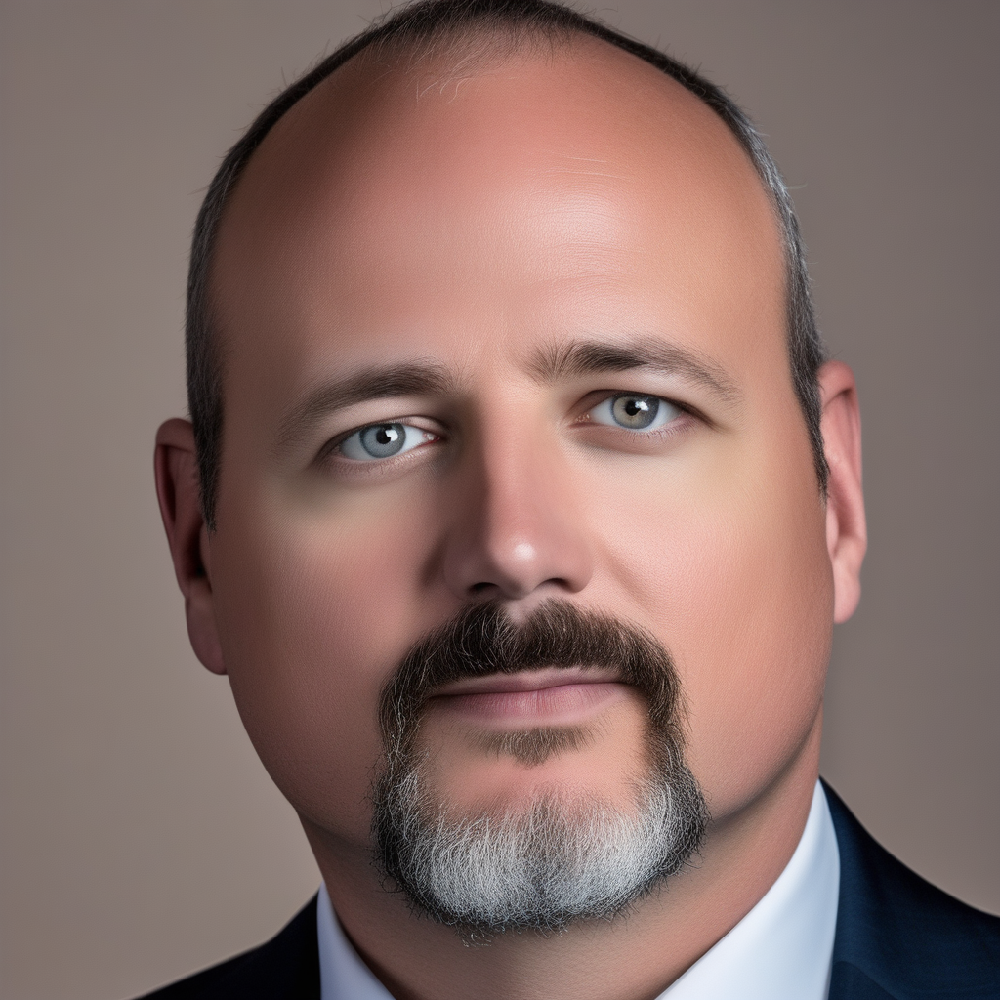

In [2]:
import torch
from diffusers import StableDiffusionXLPipeline
from peft import PeftModel

# 1. Load SDXL Base (Use bfloat16 to match your training)
print("⏳ Loading SDXL Base...")
pipe = StableDiffusionXLPipeline.from_pretrained(
    MODEL_NAME, 
    torch_dtype=FLOAT_TYPE, 
    use_safetensors=True,
    variant="fp16" # Downloads the smaller fp16 files, converts to bf16 on load
).to("cuda")

# 2. Load Your LoRA
# The modern diffusers method is usually pipe.load_lora_weights()
# BUT since we are using pure PEFT (unet.save_pretrained), 
# let's stick to the method you know works, but adapted for SDXL.
print(f"⏳ Loading LoRA from {LORA_DIR}...")
pipe.unet = PeftModel.from_pretrained(pipe.unet, LORA_DIR)
pipe.unet.to("cuda")

# 3. Generate
# Note: SDXL native resolution is 1024x1024. Do not use 512x512 (it will look blurry).
prompt = "A professional headshot of tiry person in a suit, 8k, sharp focus, cinematic lighting, detailed eyes"
negative_prompt = "cartoon, drawing, anime, blur, low quality, distortion, ugly, deformed"

print("🎨 Generating...")
image = pipe(
    prompt=prompt, 
    negative_prompt=negative_prompt, 
    num_inference_steps=40, # SDXL needs fewer steps than 1.5
    guidance_scale=7.5,
    height=1024,
    width=1024,
    cross_attention_kwargs={"scale": 1.0} # Adjust this if likeness is weak
).images[0]

display(image)
del pipe
del ima

⏳ Loading SDXL Base...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

⏳ Loading LoRA from sdxl-tiry-lora...

Generating Test Grid...
   Generating Scale 0.8...


  0%|          | 0/50 [00:00<?, ?it/s]

   Generating Scale 0.9...


  0%|          | 0/50 [00:00<?, ?it/s]

   Generating Scale 1.0...


  0%|          | 0/50 [00:00<?, ?it/s]

   Generating Scale 1.1...


  0%|          | 0/50 [00:00<?, ?it/s]

   Generating Scale 1.2...


  0%|          | 0/50 [00:00<?, ?it/s]

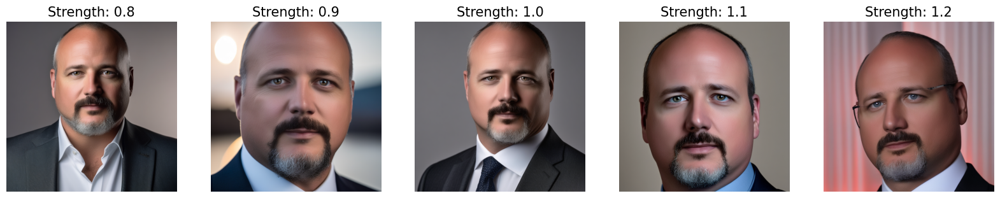

In [3]:
import torch
from diffusers import StableDiffusionXLPipeline
from peft import PeftModel
import matplotlib.pyplot as plt

# 1. Load SDXL Base (Use bfloat16 to match your training)
print("⏳ Loading SDXL Base...")
pipe = StableDiffusionXLPipeline.from_pretrained(
    MODEL_NAME, 
    torch_dtype=FLOAT_TYPE, 
    use_safetensors=True,
    variant="fp16" # Downloads the smaller fp16 files, converts to bf16 on load
).to("cuda")

# 2. Load LoRA
# The modern diffusers method is usually pipe.load_lora_weights()
# BUT since we are using pure PEFT (unet.save_pretrained), 
# let's stick to the method you know works, but adapted for SDXL.
print(f"⏳ Loading LoRA from {LORA_DIR}...")
pipe.unet = PeftModel.from_pretrained(pipe.unet, LORA_DIR)
pipe.unet.to("cuda")

# 3. Generate
# Note: SDXL native resolution is 1024x1024. Do not use 512x512 (it will look blurry).
prompt = "A professional headshot of tiry person in a suit, 8k, sharp focus, cinematic lighting, detailed eyes"
negative_prompt = "cartoon, drawing, anime, blur, low quality, distortion, ugly, deformed"
scales = [0.8, 0.9, 1.0, 1.1, 1.2] # Testing stronger weights

print("\nGenerating Test Grid...")
images = []
titles = []

for scale in scales:
    print(f"   Generating Scale {scale}...")
    image = pipe(
        prompt=prompt, 
        negative_prompt=negative_prompt, 
        num_inference_steps=50,
        guidance_scale=7.5,
        cross_attention_kwargs={"scale": scale} # The Magic Lever
    ).images[0]
    
    images.append(image)
    titles.append(f"Strength: {scale}")

# 4. Display Side-by-Side
fig, axs = plt.subplots(1, 5, figsize=(20, 6))
for i, (img, title) in enumerate(zip(images, titles)):
    axs[i].imshow(img)
    axs[i].set_title(title, fontsize=15)
    axs[i].axis("off")
plt.show()
del pipe

⏳ Loading SDXL Base...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

⏳ Loading LoRA from sdxl-tiry-lora...
Generating Showcase (5 prompts × 5 images)...
Prompt 1/5: A professional headshot of tiry person in a navy blue suit, ...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt 2/5: A candid photo of tiry person wearing a t-shirt at a coffee ...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt 3/5: A street photo of tiry person walking in New York City, over...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt 4/5: A cinematic portrait of tiry person, dramatic rim light, sha...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt 5/5: Oil painting of tiry person as a viking warrior, fur armor, ...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

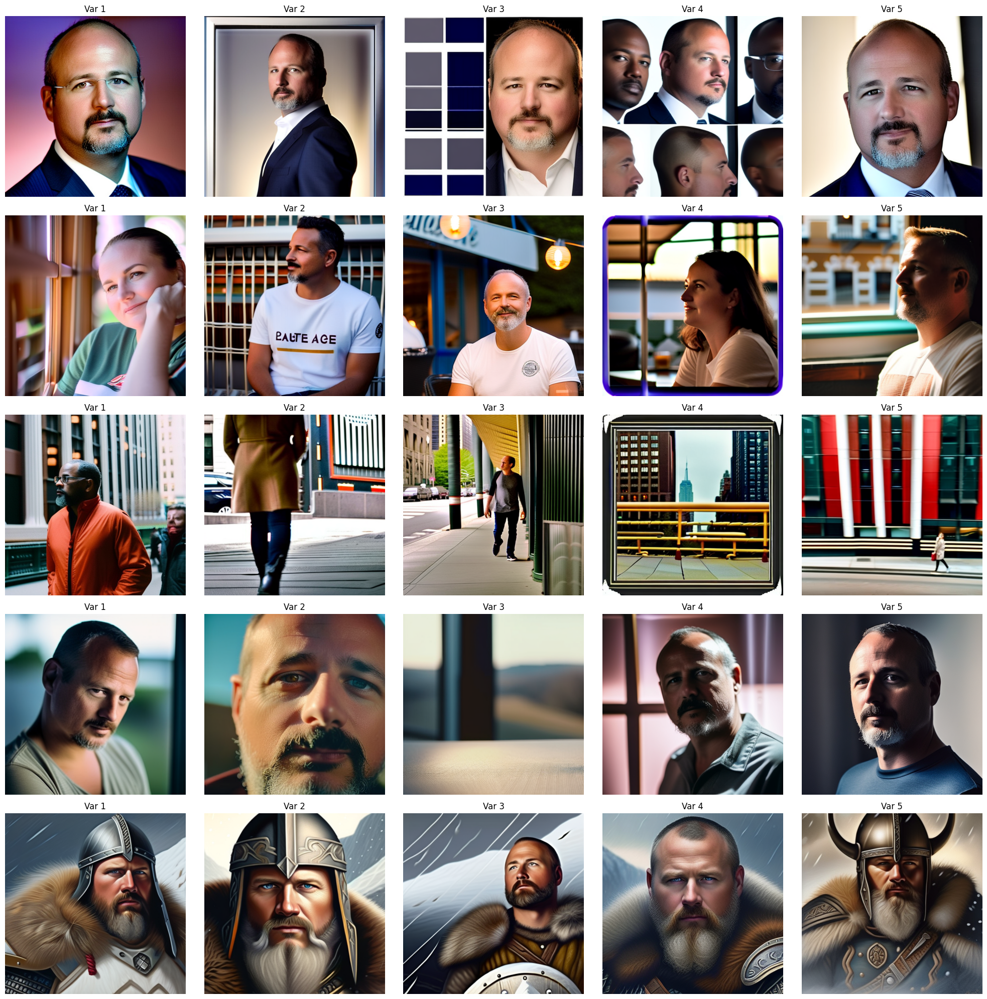

In [9]:
import torch
from diffusers import StableDiffusionXLPipeline
from peft import PeftModel
import matplotlib.pyplot as plt

DEVICE = "cuda"

# 1. Load SDXL Base (Use bfloat16 to match your training)
print("⏳ Loading SDXL Base...")
pipe = StableDiffusionXLPipeline.from_pretrained(
    MODEL_NAME, 
    torch_dtype=FLOAT_TYPE, 
    use_safetensors=True,
    variant="fp16" # Downloads the smaller fp16 files, converts to bf16 on load
).to("cuda")

# 2. Load LoRA
# The modern diffusers method is usually pipe.load_lora_weights()
# BUT since we are using pure PEFT (unet.save_pretrained), 
# let's stick to the method you know works, but adapted for SDXL.
print(f"⏳ Loading LoRA from {LORA_DIR}...")
pipe.unet = PeftModel.from_pretrained(pipe.unet, LORA_DIR)
pipe.unet.to("cuda")

# 3) Five prompts (edit as you like)
prompts = [
    # 1. Professional
    "A professional headshot of tiry person in a navy blue suit, white shirt, studio lighting, sharp focus, canon 5d",

    # 2. Casual
    "A candid photo of tiry person wearing a t-shirt at a coffee shop, golden hour lighting, depth of field, bokeh",

    # 3. Outdoor / travel
    "A street photo of tiry person walking in New York City, overcast daylight, 35mm lens, natural skin texture, documentary style",

    # 4. Cinematic portrait
    "A cinematic portrait of tiry person, dramatic rim light, shallow depth of field, film grain, 85mm lens, realistic",

    # 5. Fantasy / stylized
    "Oil painting of tiry person as a viking warrior, fur armor, snow storm background, intricate beard detail, painterly, high detail",
]

negative_prompt = "cartoon, drawing, anime, blur, low quality, distortion, ugly, deformed, extra fingers"

# Generation params
NUM_PER_PROMPT = 5
NUM_INFERENCE_STEPS = 50
GUIDANCE_SCALE = 7.0
LORA_SCALE = 1.2  # force
HEIGHT = 512
WIDTH = 512

# Use fixed seeds for consistent variations across prompts
base_seed = 10000
generators = [torch.Generator(device=DEVICE).manual_seed(base_seed + i) for i in range(NUM_PER_PROMPT)]

print("Generating Showcase (5 prompts × 5 images)...")
all_images = []  # list of rows; each row has 5 images

for p_idx, p in enumerate(prompts):
    print(f"Prompt {p_idx+1}/{len(prompts)}: {p[:60]}...")
    row_imgs = []
    for i in range(NUM_PER_PROMPT):
        img = pipe(
            p,
            negative_prompt=negative_prompt,
            num_inference_steps=NUM_INFERENCE_STEPS,
            guidance_scale=GUIDANCE_SCALE,
            height=HEIGHT,
            width=WIDTH,
            generator=generators[i],
            cross_attention_kwargs={"scale": LORA_SCALE},
        ).images[0]
        row_imgs.append(img)
    all_images.append(row_imgs)

# 4) Display as a 5x5 grid
fig, axs = plt.subplots(len(prompts), NUM_PER_PROMPT, figsize=(NUM_PER_PROMPT * 4, len(prompts) * 4))

# If axs is 2D: axs[row][col]
for r in range(len(prompts)):
    for c in range(NUM_PER_PROMPT):
        ax = axs[r, c] if len(prompts) > 1 else axs[c]
        ax.imshow(all_images[r][c])
        if c == 0:
            ax.set_ylabel(f"Prompt {r+1}", fontsize=12)
        ax.set_title(f"Var {c+1}", fontsize=12)
        ax.axis("off")

plt.tight_layout()
plt.show()
del pipe

⏳ Loading SDXL Base...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

⏳ Loading LoRA from sdxl-tiry-lora...
🎨 Generating...


  0%|          | 0/40 [00:00<?, ?it/s]

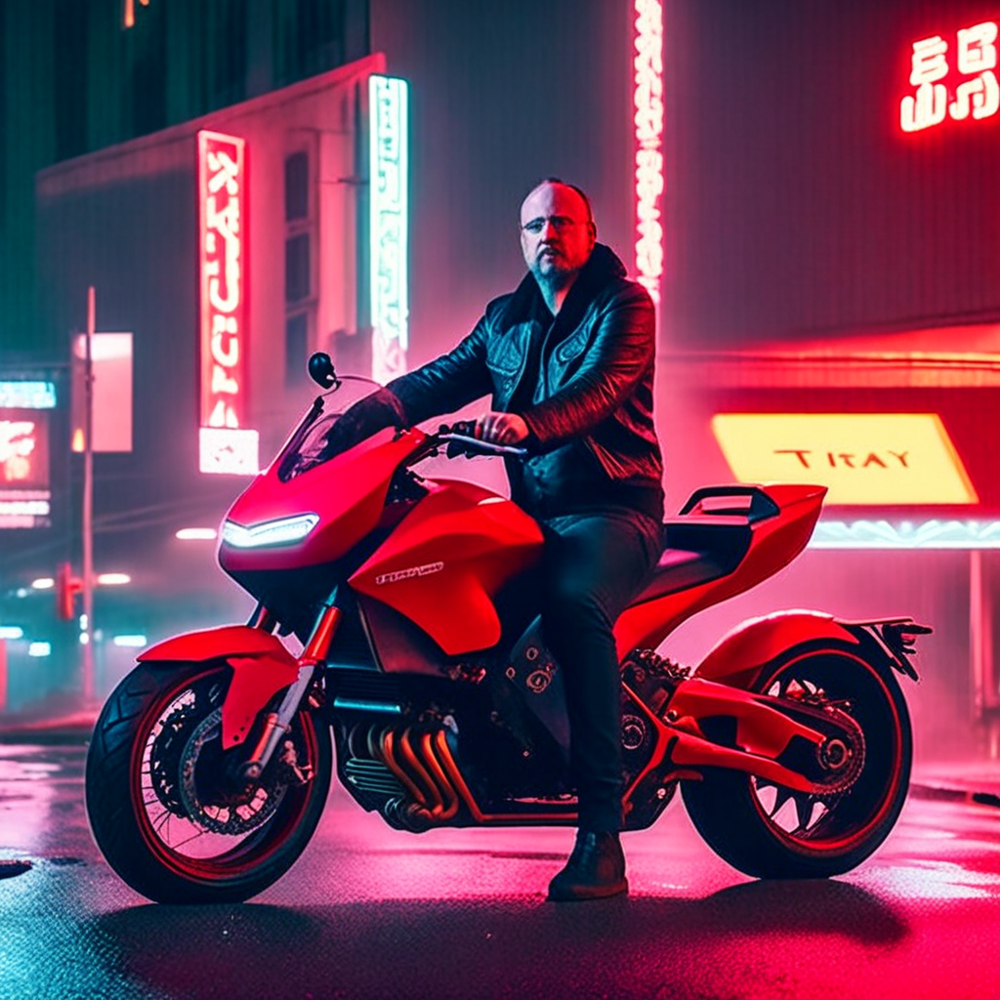

In [8]:
import torch
from diffusers import StableDiffusionXLPipeline
from peft import PeftModel

# 1. Load SDXL Base (Use bfloat16 to match your training)
print("⏳ Loading SDXL Base...")
pipe = StableDiffusionXLPipeline.from_pretrained(
    MODEL_NAME, 
    torch_dtype=FLOAT_TYPE, 
    use_safetensors=True,
    variant="fp16" # Downloads the smaller fp16 files, converts to bf16 on load
).to("cuda")

# 2. Load Your LoRA
# The modern diffusers method is usually pipe.load_lora_weights()
# BUT since we are using pure PEFT (unet.save_pretrained), 
# let's stick to the method you know works, but adapted for SDXL.
print(f"⏳ Loading LoRA from {LORA_DIR}...")
pipe.unet = PeftModel.from_pretrained(pipe.unet, LORA_DIR)
pipe.unet.to("cuda")

# 3. Generate
# Note: SDXL native resolution is 1024x1024. Do not use 512x512 (it will look blurry).
prompt = "Cinematic shot of tiry person sitting on a bright red futuristic Akira-style motorcycle, neon cyberpunk city background, night, wet pavement. Tiry person has messy hair, no helmet. Volumetric lighting, photorealistic, 8k."
negative_prompt = "helmet, headgear, anime, cartoon, 3d render, blurry, bad anatomy."
    
print("🎨 Generating...")
image = pipe(
    prompt=prompt, 
    negative_prompt=negative_prompt, 
    num_inference_steps=40, 
    guidance_scale=7.5,
    height=1024,
    width=1024,
    cross_attention_kwargs={"scale": 1.6} # Adjust to force
).images[0]

display(image)
del pipe